In [1]:
## Explainability
import numpy as np
import sklearn
#!pip install lime
import lime
import lime.lime_tabular
from sklearn.externals import joblib
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

import tensorflow as tf
sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True,
                                        log_device_placement=True))
from helpful_util import *
from heaton_utils import *
from pylab import rcParams
import seaborn as sns
rcParams['figure.figsize'] = 7,7  #Adjust plot size

Using TensorFlow backend.


In [2]:
#Loading COO Matrices - sparse with OHE of all original Features

feature_names = [
    "Age", "Workclass", "fnlwgt", "Education", "Education-Num",
    "Marital Status", "Occupation", "Relationship", "Race", "Sex",
    "Capital Gain", "Capital Loss", "Hours per week", "Country"
]

data = np.genfromtxt('data\\adult.data', delimiter=', ',
                     dtype=str)  #read in data file

#Let's downsample this
neg_target = data[data[:, 14] == '<=50K']
pos_target = data[data[:, 14] != '<=50K']
neg_target = neg_target[:7481]
data = np.concatenate((pos_target, neg_target))

y = data[:, 14]  #response var
le = sklearn.preprocessing.LabelEncoder()  #instantiate label encoder
le.fit(y)  #fit label encoder to response
y = le.transform(y)  #encode response
class_names = le.classes_  #get class names of response
data = data[:, :-1]  #Get all Independent Vars

categorical_features = [1, 3, 5, 6, 7, 8, 9,
                        13]  #Get Nominal / Ordinal / etc..

categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()  #instantiate label encoder
    le.fit(data[:, feature])  #fit label encoder to categorical features
    data[:, feature] = le.transform(
        data[:, feature])  #transform categorical features
    categorical_names[
        feature] = le.classes_  #get categorical feature class names and append to dict

X = data.astype(float)
encoder = sklearn.preprocessing.OneHotEncoder(
    categorical_features=categorical_features)  #instantiate OHE

np.random.seed(1)
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(
    X, y, train_size=0.80)  #split data

encoder.fit(data)  #OHE Categorical Columns
encoded_train = encoder.transform(X_train)  #Encode Training Set

In [3]:
from keras.models import load_model


def load_models():
    sklearn_nn_file = 'models\\UCI_Census\\SklearnNeuralNet.pkl'
    keras_ann_file = 'models\\UCI_Census\\ann_gridsearch.h5'
    rf_file = "models\\UCI_Census\\random_forest.pkl"
    gbc_file = "models\\UCI_Census\\GBC.pkl"
    logit_file = "models\\UCI_Census\\Logit.pkl"

    rfc = joblib.load(rf_file)
    gbc = joblib.load(gbc_file)
    logit = joblib.load(logit_file)
    keras_ann = load_model(keras_ann_file)
    sk_ann = joblib.load(sklearn_nn_file)

    return rfc, gbc, logit, keras_ann, sk_ann


rfc, gbc, logit, keras_ann, sk_ann = load_models()

#Some classification Reports and Confusion Matrices
from sklearn.metrics import confusion_matrix, classification_report

class_names = ['<50k', '>50k']

rf_best_score = sklearn.metrics.accuracy_score(
    y_test, rfc.predict(encoder.transform(X_test)))
gbc_best_score = sklearn.metrics.accuracy_score(
    y_test, gbc.predict(encoder.transform(X_test)))
lr_best_score = sklearn.metrics.accuracy_score(
    y_test, logit.predict(encoder.transform(X_test)))
nn_best_score = sklearn.metrics.accuracy_score(
    y_test, sk_ann.predict(encoder.transform(X_test)))
ker_nn_best_score = sklearn.metrics.accuracy_score(
    y_test,
    np.argmax(keras_ann.predict(encoder.transform(X_test).toarray()), axis=1))

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [4]:
print("\033[1mPrinting Test Accuracy.... \033[0m")
print("Random Forest: {0:.2f} %".format(rf_best_score * 100))
print("Gradient Boosting: {0:.2f} %".format(gbc_best_score * 100))
print("Logistic Regression: {0:.2f} %".format(lr_best_score * 100))
print("SKLEARN Neural Net: {0:.2f} %".format(nn_best_score * 100))
print("Keras Neural Net: {0:.2f} % \n \n".format(ker_nn_best_score * 100))

Printing Test Accuracy.... 
Random Forest: 97.55 %
Gradient Boosting: 88.58 %
Logistic Regression: 82.45 %
SKLEARN Neural Net: 51.58 %
Keras Neural Net: 78.08 % 
 



 Random Forest Classification Report...
 
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1484
           1       0.96      0.99      0.98      1581

   micro avg       0.98      0.98      0.98      3065
   macro avg       0.98      0.97      0.98      3065
weighted avg       0.98      0.98      0.98      3065



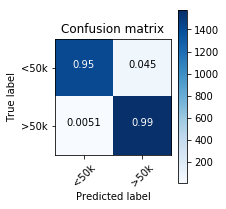

 Gradient Boosting Classification Report...
 
              precision    recall  f1-score   support

           0       0.91      0.85      0.88      1484
           1       0.87      0.92      0.89      1581

   micro avg       0.89      0.89      0.89      3065
   macro avg       0.89      0.88      0.89      3065
weighted avg       0.89      0.89      0.89      3065



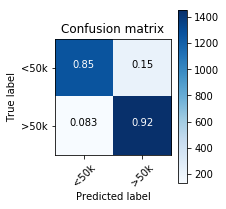

 Logistic Regression Classification Report...
 
              precision    recall  f1-score   support

           0       0.84      0.79      0.81      1484
           1       0.81      0.86      0.83      1581

   micro avg       0.82      0.82      0.82      3065
   macro avg       0.83      0.82      0.82      3065
weighted avg       0.83      0.82      0.82      3065



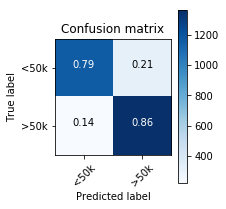

 SKLEARN Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1484
           1       0.52      1.00      0.68      1581

   micro avg       0.52      0.52      0.52      3065
   macro avg       0.26      0.50      0.34      3065
weighted avg       0.27      0.52      0.35      3065



C:\ProgramData\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


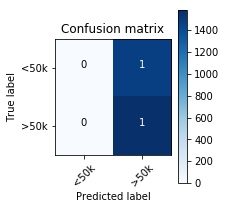

 KERAS Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.73      0.86      0.79      1484
           1       0.84      0.71      0.77      1581

   micro avg       0.78      0.78      0.78      3065
   macro avg       0.79      0.78      0.78      3065
weighted avg       0.79      0.78      0.78      3065



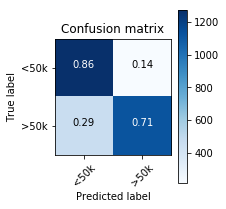

In [5]:
rcParams['figure.figsize'] = 3, 3  #Adjust plot size

print("\033[1m Random Forest Classification Report...\n \033[0m")
print(classification_report(y_test, rfc.predict(encoder.transform(X_test))))
cm = confusion_matrix(y_test, rfc.predict(encoder.transform(X_test)))
plot_confusion_matrix(cm, classes=class_names, normalize= True)
plt.show()

print("\033[1m Gradient Boosting Classification Report...\n \033[0m")
print(classification_report(y_test, gbc.predict(encoder.transform(X_test))))
cm = confusion_matrix(y_test, gbc.predict(encoder.transform(X_test)))
plot_confusion_matrix(cm, classes=class_names,normalize= True)
plt.show()

print("\033[1m Logistic Regression Classification Report...\n \033[0m")
print(classification_report(y_test, logit.predict(encoder.transform(X_test))))
cm = confusion_matrix(y_test, logit.predict(encoder.transform(X_test)))
plot_confusion_matrix(cm, classes=class_names, normalize= True)
plt.show()

print("\033[1m SKLEARN Neural Network Classification Report...\n \033[0m")
print(classification_report(y_test, sk_ann.predict(encoder.transform(X_test))))
cm = confusion_matrix(y_test,sk_ann.predict(encoder.transform(X_test)))
plot_confusion_matrix(cm, classes=class_names, normalize= True)
plt.show()


print("\033[1m KERAS Neural Network Classification Report...\n \033[0m")
print(
    classification_report(
        y_test,
        np.argmax(keras_ann.predict(encoder.transform(X_test).toarray()),
                  axis=1)))
cm = confusion_matrix(
    y_test,
    np.argmax(keras_ann.predict(encoder.transform(X_test).toarray()), axis=1))
plot_confusion_matrix(cm, classes=class_names, normalize= True)
plt.show()

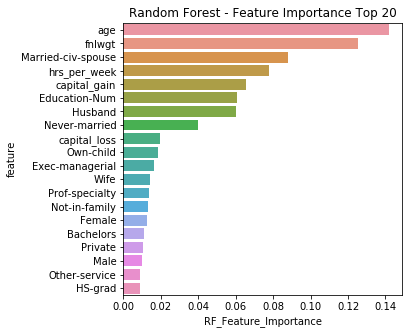

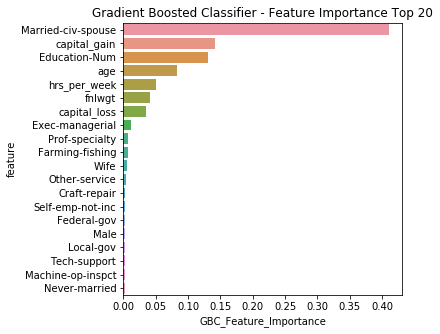

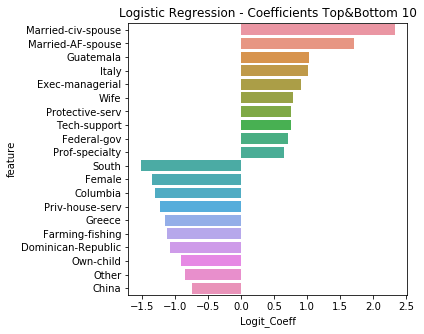

In [6]:
#SciKit Learn Feature Importance in Linear Coefficient Rankinks

rcParams['figure.figsize'] = 5,5 #Adjust plot size

features = []
for k in categorical_names.values():
    for i in k:
        features.append(i)
        
continuous = ['age', 'fnlwgt', 'Education-Num','capital_gain','capital_loss','hrs_per_week']

features = features + continuous



def display_sklearn_feature_importance(n_features):
    feature_importance = pd.DataFrame({
        "feature":
        features,
        "RF_Feature_Importance":
        np.round(rfc.feature_importances_, 4),
        "GBC_Feature_Importance":
        np.round(gbc.feature_importances_, 4),
        "Logit_Coeff":
        np.round(logit.coef_[0], 4)
    })

    n = n_features

    temp = feature_importance.nlargest(n, 'RF_Feature_Importance')
    sns.barplot(temp['RF_Feature_Importance'], temp['feature'])
    plt.title('Random Forest - Feature Importance Top {}'.format(n_features))
    plt.show()

    temp = feature_importance.nlargest(n, 'GBC_Feature_Importance')
    sns.barplot(temp['GBC_Feature_Importance'], temp['feature'])
    plt.title('Gradient Boosted Classifier - Feature Importance Top {}'.format(n_features))
    plt.show()

    temp = feature_importance.nlargest(int(n / 2), 'Logit_Coeff')
    temp1 = feature_importance.nsmallest(int(n / 2), 'Logit_Coeff')
    temp = pd.concat([temp, temp1])
    sns.barplot(temp['Logit_Coeff'], temp['feature'])
    plt.title('Logistic Regression - Coefficients Top&Bottom {}'.format(int(n_features /2 )))
    plt.show()


display_sklearn_feature_importance(n_features=20)

-----------------------------------------------------------------------------------------------------------------------------
Looking at Observation: 2000
Actual Class Label: 1
Predicted Class Label: 1
Prediction Confidence (Prob): 92.80%
-----------------------------------------------------------------------------------------------------------------------------
Displaying Local Explanation for Prediction: Top 10 Features......


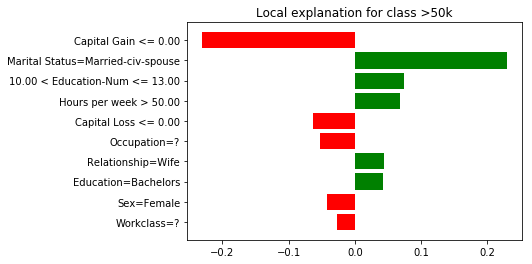

In [7]:
'''
Model Choice:
Random Forest: rfc
Gradient Boosted Classifier: gbc
Logistic Regression: logit
Keras Neural Network = keras_ann
Sklearn Neural Network = sk_ann
'''
def explain_lime(model, observation, seed = 1, keras = False, num_features = 10):

    if keras:
        predict_fn = lambda x: model.predict(encoder.transform(x).toarray())

        explainer = lime.lime_tabular.LimeTabularExplainer(
            X_train,
            feature_names=feature_names,
            class_names=class_names,
            categorical_features=categorical_features,
            categorical_names=categorical_names,
            kernel_width=3)

        np.random.seed(seed)
        i = observation

        exp = explainer.explain_instance(X_test[i], predict_fn, num_features=5)
        exp.show_in_notebook(show_all=True)
        %matplotlib inline
        print("Looking at Observation: {}".format(i))
        print("Actual Class Label: {}".format(y_test[i]))
        print("Predicted Class Label: {}".format(np.argmax(model.predict(encoder.transform(X_test).toarray()),axis = 1)[i]))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict(encoder.transform(X_test).toarray())[i]*100)))
        print("Displaying Local Explanation for Prediction......")
        fig = exp.as_pyplot_figure()
    else:

        predict_fn = lambda x: model.predict_proba(encoder.transform(x)).astype(float)

        explainer = lime.lime_tabular.LimeTabularExplainer(
            X_train,
            feature_names=feature_names,
            class_names=class_names,
            categorical_features=categorical_features,
            categorical_names=categorical_names,
            kernel_width=3)

        np.random.seed(seed)
        i = observation

        exp = explainer.explain_instance(X_test[i], predict_fn, num_features=num_features)
        exp.show_in_notebook(show_all=True)
        %matplotlib inline
        print('-' * 125)
        print("Looking at Observation: {}".format(i))
        print("Actual Class Label: {}".format(y_test[i]))
        print("Predicted Class Label: {}".format(np.argmax(model.predict_proba(encoder.transform(X_test[i].reshape(1,-1))).astype(float))
        ))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict_proba(encoder.transform(X_test[i].reshape(1,-1)))[0])*100))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction: Top {} Features......".format(num_features))
        fig = exp.as_pyplot_figure()
        
        
explain_lime(model = rfc, observation=2000, keras=False) #Turn Keras Flag on for Keras NN



In [8]:
#Put Data in Shap Friendly Format
X_train = pd.DataFrame(encoded_train.toarray(), columns= features)
X_test = pd.DataFrame(encoder.transform(X_test).toarray(), columns= features)
X = pd.concat([X_train, X_test])

In [9]:
#Local Explainability
import shap

import warnings
warnings.filterwarnings('ignore')

def shap_local_graph(model, observation):
    f = lambda x: model.predict_proba(x)[:,1]
    med = X_train.median().values.reshape((1,X_train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    shap_values_single = explainer.shap_values(X.iloc[observation,:], nsamples=1000)
    return shap.force_plot(explainer.expected_value, shap_values_single, feature_names= features)

'''
Model Choice:
Random Forest: rfc
Gradient Boosted Classifier: gbc
Logistic Regression: logit
Keras Neural Network = keras_ann
Sklearn Neural Network = sk_ann
'''
shap_local_graph(model = rfc, observation = 2000)

In [10]:


def shap_many_graph(model):
    f = lambda x: model.predict_proba(x)[:,1]
    med = X_train.median().values.reshape((1,X_train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    shap_values = explainer.shap_values(X_test)
    return shap.force_plot(explainer.expected_value, shap_values, X_test)

shap_many_graph(logit)


100%|██████████| 3065/3065 [01:27<00:00, 35.22it/s]


100%|██████████| 3065/3065 [03:53<00:00, 13.15it/s]


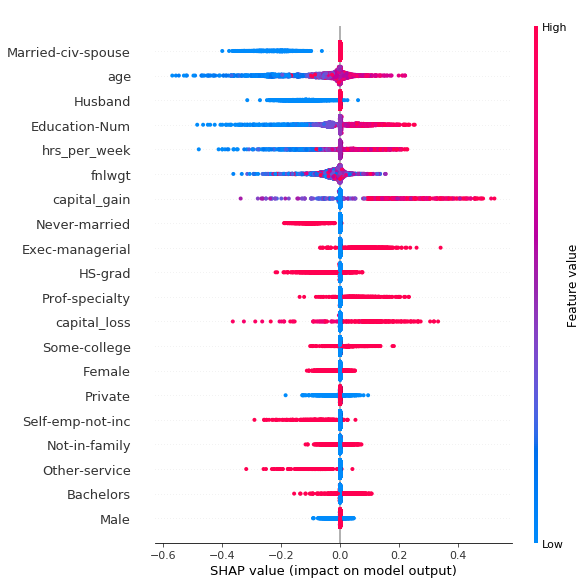

In [11]:
def shap_summary_graph(model):
    f = lambda x: model.predict_proba(x)[:,1]
    med = X_train.median().values.reshape((1,X_train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    shap_values = explainer.shap_values(X_test)
    return shap.summary_plot(shap_values, X_test)

shap_summary_graph(rfc)